In [1]:
# Behavioral cloning 

In [2]:
!git clone https://github.com/Rishikesh-Jadhav/Track_Deep_Learning

Cloning into 'Track_Deep_Learning'...
Updating files:  15% (2674/17017)
Updating files:  16% (2723/17017)
Updating files:  17% (2893/17017)
Updating files:  18% (3064/17017)
Updating files:  19% (3234/17017)
Updating files:  20% (3404/17017)
Updating files:  21% (3574/17017)
Updating files:  22% (3744/17017)
Updating files:  23% (3914/17017)
Updating files:  24% (4085/17017)
Updating files:  25% (4255/17017)
Updating files:  26% (4425/17017)
Updating files:  27% (4595/17017)
Updating files:  28% (4765/17017)
Updating files:  29% (4935/17017)
Updating files:  30% (5106/17017)
Updating files:  31% (5276/17017)
Updating files:  32% (5446/17017)
Updating files:  33% (5616/17017)
Updating files:  34% (5786/17017)
Updating files:  35% (5956/17017)
Updating files:  36% (6127/17017)
Updating files:  37% (6297/17017)
Updating files:  38% (6467/17017)
Updating files:  39% (6637/17017)
Updating files:  40% (6807/17017)
Updating files:  41% (6977/17017)
Updating files:  42% (7148/17017)
Updating f

In [3]:
!pip3 install imgaug

     ------------------------------------- 948.0/948.0 kB 20.0 MB/s eta 0:00:00
     --------------------------------------- 38.2/38.2 MB 27.3 MB/s eta 0:00:00
     ---------------------------------------- 1.4/1.4 MB 28.9 MB/s eta 0:00:00


In [4]:
!ls Track_Deep_Learning/

'ls' is not recognized as an internal or external command,
operable program or batch file.


In [7]:
pip install keras


     ---------------------------------------- 1.7/1.7 MB 26.6 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [8]:
pip install tensorflow

     -------------------------------------- 266.3/266.3 MB 5.1 MB/s eta 0:00:00
     ------------------------------------- 895.9/895.9 kB 18.8 MB/s eta 0:00:00
     ---------------------------------------- 3.7/3.7 MB 26.5 MB/s eta 0:00:00
     ---------------------------------------- 23.2/23.2 MB 9.5 MB/s eta 0:00:00
     ---------------------------------------- 439.2/439.2 kB ? eta 0:00:00
     ---------------------------------------- 6.0/6.0 MB 3.9 MB/s eta 0:00:00
     -------------------------------------- 126.5/126.5 kB 1.1 MB/s eta 0:00:00
     ---------------------------------------- 57.5/57.5 kB 1.0 MB/s eta 0:00:00
     ---------------------------------------- 1.5/1.5 MB 3.0 MB/s eta 0:00:00
     ---------------------------------------- 65.5/65.5 kB ? eta 0:00:00
     -------------------------------------- 177.8/177.8 kB 5.4 MB/s eta 0:00:00
     -------------------------------------- 781.3/781.3 kB 4.5 MB/s eta 0:00:00
     -------------------------------------- 151.7/151.7 k

In [10]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import keras
from keras.models import Sequential
from keras.optimizers import Adam
from keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout
import pandas as pd
from imgaug import augmenters as iaa #create functions for these augmentation techniques and call when required
import cv2
import random
import os # module helpful for path inclusion instead of specifying string path
import ntpath # to split path
from sklearn.utils import shuffle

from sklearn.model_selection import train_test_split

%matplotlib inline

In [11]:
data_directory = 'Track_Deep_Learning'
columns = ['center','left','right','steering','throttle','reverse','speed']
df = pd.read_csv(os.path.join(data_directory,'driving_log.csv'), names = columns)
pd.set_option('display.max_colwidth', -1)
df.head(5) 

C:\Users\rishi\AppData\Local\Temp\ipykernel_6100\3781400035.py:4: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option('display.max_colwidth', -1)


,center,left,right,steering,throttle,reverse,speed
0,C:\Users\rishi\OneDrive\Desktop\Autonomous_car_deep_learning\data\IMG\center_2023_02_13_14_28_29_922.jpg,C:\Users\rishi\OneDrive\Desktop\Autonomous_car_deep_learning\data\IMG\left_2023_02_13_14_28_29_922.jpg,C:\Users\rishi\OneDrive\Desktop\Autonomous_car_deep_learning\data\IMG\right_2023_02_13_14_28_29_922.jpg,0.0,0.0,0.0,0.000078
1,C:\Users\rishi\OneDrive\Desktop\Autonomous_car_deep_learning\data\IMG\center_2023_02_13_14_28_30_025.jpg,C:\Users\rishi\OneDrive\Desktop\Autonomous_car_deep_learning\data\IMG\left_2023_02_13_14_28_30_025.jpg,C:\Users\rishi\OneDrive\Desktop\Autonomous_car_deep_learning\data\IMG\right_2023_02_13_14_28_30_025.jpg,0.0,0.0,0.0,0.000081
2,C:\Users\rishi\OneDrive\Desktop\Autonomous_car_deep_learning\data\IMG\center_2023_02_13_14_28_30_127.jpg,C:\Users\rishi\OneDrive\Desktop\Autonomous_car_deep_learning\data\IMG\left_2023_02_13_14_28_30_127.jpg,C:\Users\rishi\OneDrive\Desktop\Autonomous_car_deep_learning\data\IMG\right_2023_02_13_14_28_30_127.jpg,0.0,0.0,0.0,0.000079
3,C:\Users\rishi\OneDrive\Desktop\Autonomous_car_deep_learning\data\IMG\center_2023_02_13_14_28_30_227.jpg,C:\Users\rishi\OneDrive\Desktop\Autonomous_car_deep_learning\data\IMG\left_2023_02_13_14_28_30_227.jpg,C:\Users\rishi\OneDrive\Desktop\Autonomous_car_deep_learning\data\IMG\right_2023_02_13_14_28_30_227.jpg,0.0,0.0,0.0,0.000078
4,C:\Users\rishi\OneDrive\Desktop\Autonomous_car_deep_learning\data\IMG\center_2023_02_13_14_28_30_329.jpg,C:\Users\rishi\OneDrive\Desktop\Autonomous_car_deep_learning\data\IMG\left_2023_02_13_14_28_30_329.jpg,C:\Users\rishi\OneDrive\Desktop\Autonomous_car_deep_learning\data\IMG\right_2023_02_13_14_28_30_329.jpg,0.0,0.0,0.0,0.000079


In [12]:
def path_leaf(path): # apply this to all of our data
  head,tail = ntpath.split(path)
  return tail

df['center'] = df['center'].apply(path_leaf)
df['left'] = df['left'].apply(path_leaf)
df['right'] = df['right'].apply(path_leaf)

df.head(10)

,center,left,right,steering,throttle,reverse,speed
0,center_2023_02_13_14_28_29_922.jpg,left_2023_02_13_14_28_29_922.jpg,right_2023_02_13_14_28_29_922.jpg,0.0,0.0,0.0,0.000078
1,center_2023_02_13_14_28_30_025.jpg,left_2023_02_13_14_28_30_025.jpg,right_2023_02_13_14_28_30_025.jpg,0.0,0.0,0.0,0.000081
2,center_2023_02_13_14_28_30_127.jpg,left_2023_02_13_14_28_30_127.jpg,right_2023_02_13_14_28_30_127.jpg,0.0,0.0,0.0,0.000079
3,center_2023_02_13_14_28_30_227.jpg,left_2023_02_13_14_28_30_227.jpg,right_2023_02_13_14_28_30_227.jpg,0.0,0.0,0.0,0.000078
4,center_2023_02_13_14_28_30_329.jpg,left_2023_02_13_14_28_30_329.jpg,right_2023_02_13_14_28_30_329.jpg,0.0,0.0,0.0,0.000079
5,center_2023_02_13_14_28_30_430.jpg,left_2023_02_13_14_28_30_430.jpg,right_2023_02_13_14_28_30_430.jpg,0.0,0.0,0.0,0.000079
6,center_2023_02_13_14_28_30_531.jpg,left_2023_02_13_14_28_30_531.jpg,right_2023_02_13_14_28_30_531.jpg,0.0,0.0,0.0,0.000078
7,center_2023_02_13_14_28_30_634.jpg,left_2023_02_13_14_28_30_634.jpg,right_2023_02_13_14_28_30_634.jpg,0.0,0.0,0.0,0.000078
8,center_2023_02_13_14_28_30_740.jpg,left_2023_02_13_14_28_30_740.jpg,right_2023_02_13_14_28_30_740.jpg,0.0,0.0,0.0,0.000081
9,center_2023_02_13_14_28_30_842.jpg,left_2023_02_13_14_28_30_842.jpg,right_2023_02_13_14_28_30_842.jpg,0.0,0.0,0.0,0.000078


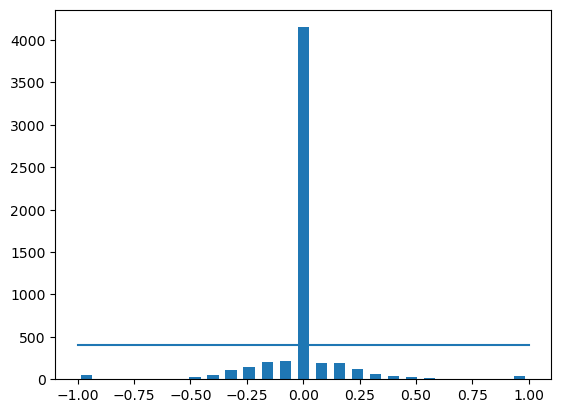

In [13]:
num_bins = 25
samples_per_bin = 400
hist, bins = np.histogram(df['steering'], num_bins)
center = (bins[:-1]+ bins[1:]) * 0.5
plt.bar(center, hist, width=0.05)
plt.plot((np.min(df['steering']), np.max(df['steering'])), (samples_per_bin, samples_per_bin))

total data: 5672
removed: 3751
remaining: 1921


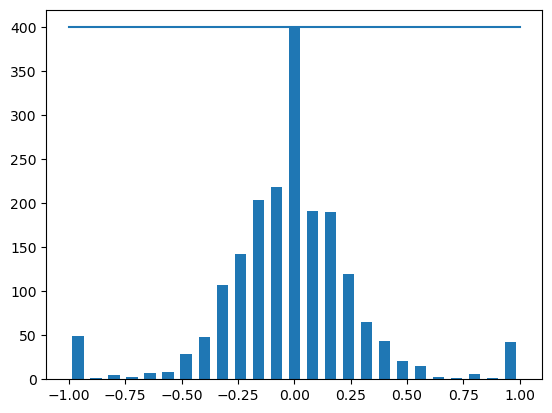

In [14]:
print('total data:', len(df))
remove_list = []
for j in range(num_bins):
  list_ = []
  for i in range(len(df['steering'])):
    if df['steering'][i] >= bins[j] and df['steering'][i] <= bins[j+1]:
      list_.append(i)
  list_ = shuffle(list_)
  list_ = list_[samples_per_bin:]
  remove_list.extend(list_)
 
print('removed:', len(remove_list))
df.drop(df.index[remove_list], inplace=True)
print('remaining:', len(df))
 
hist, _ = np.histogram(df['steering'], (num_bins))
plt.bar(center, hist, width=0.05)
plt.plot((np.min(df['steering']), np.max(df['steering'])), (samples_per_bin, samples_per_bin))


In [15]:
print(df.iloc[1])
def load_img_steering(datadir, df):
  image_path = []
  steering = []
  for i in range(len(df)):
    indexed_data = df.iloc[i]
    center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
    image_path.append(os.path.join(datadir, center.strip()))
    steering.append(float(indexed_data[3]))
    # left image append
    image_path.append(os.path.join(datadir,left.strip()))
    steering.append(float(indexed_data[3])+0.15)
    # right image append
    image_path.append(os.path.join(datadir,right.strip()))
    steering.append(float(indexed_data[3])-0.15)
  image_paths = np.asarray(image_path)
  steerings = np.asarray(steering)
  return image_paths, steerings

center      center_2023_02_13_14_28_30_842.jpg
left        left_2023_02_13_14_28_30_842.jpg  
right       right_2023_02_13_14_28_30_842.jpg 
steering    0.0                               
throttle    0.0                               
reverse     0.0                               
speed       0.000078                          
Name: 9, dtype: object


Training Samples: 4610
Valid Samples: 1153


Text(0.5, 1.0, 'Validation set')

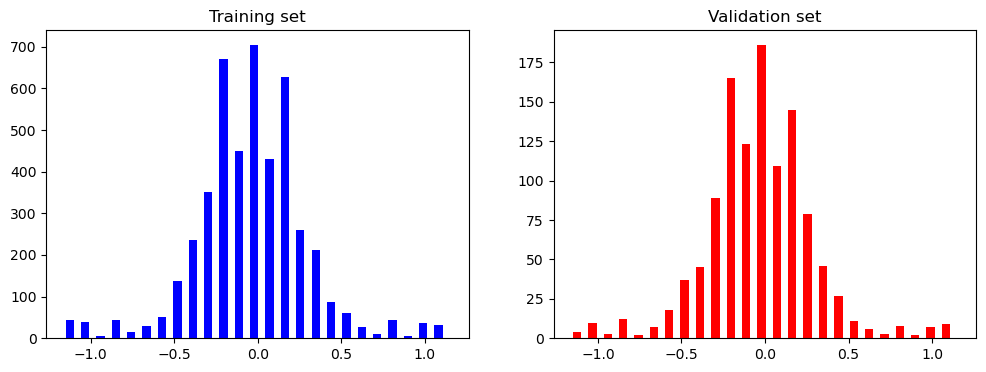

In [16]:
image_paths, steerings = load_img_steering(data_directory + '/IMG', df)
X_train, X_valid, y_train, y_valid = train_test_split(image_paths, steerings, test_size=0.2, random_state=6)
print('Training Samples: {}\nValid Samples: {}'.format(len(X_train), len(X_valid)))
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(y_train, bins=num_bins, width=0.05, color='blue')
axes[0].set_title('Training set')
axes[1].hist(y_valid, bins=num_bins, width=0.05, color='red')
axes[1].set_title('Validation set')

Text(0.5, 1.0, 'Zoomed Image')

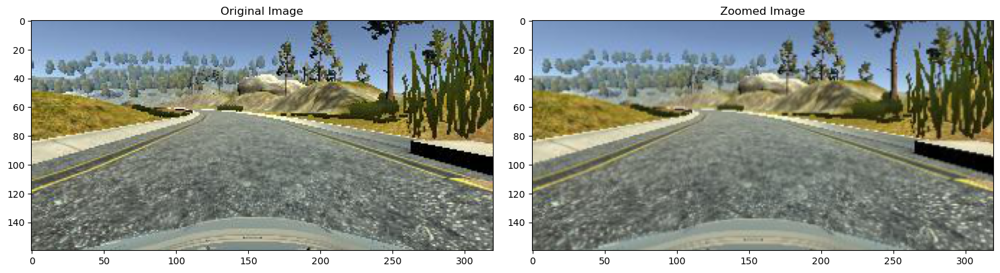

In [17]:

def zoom(image):
  zoom = iaa.Affine(scale=(1, 1.3))
  image = zoom.augment_image(image)
  return image
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
zoomed_image = zoom(original_image)
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
 
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
 
axs[1].imshow(zoomed_image)
axs[1].set_title('Zoomed Image')

Text(0.5, 1.0, 'Panned Image')

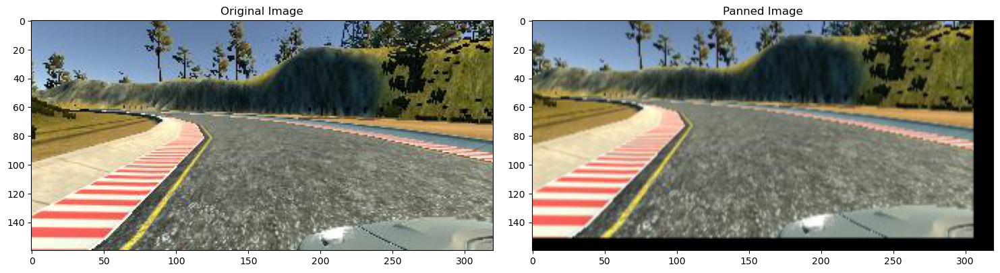

In [18]:
def pan(image):
  pan = iaa.Affine(translate_percent= {"x" : (-0.1, 0.1), "y": (-0.1, 0.1)})
  image = pan.augment_image(image)
  return image
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
 
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
 
axs[1].imshow(panned_image)
axs[1].set_title('Panned Image')


Text(0.5, 1.0, 'Brightness altered image ')

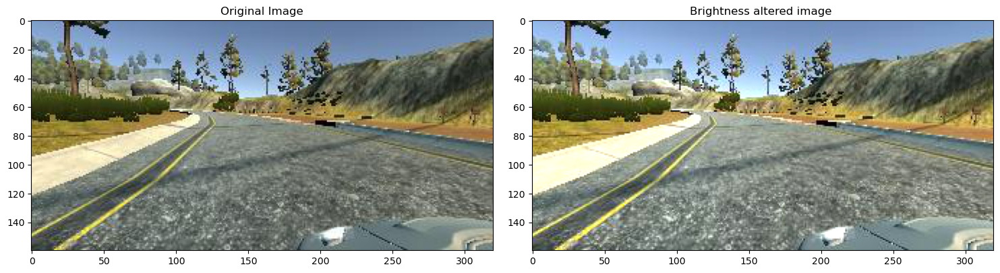

In [19]:
def img_random_brightness(image):
    brightness = iaa.Multiply((0.2, 1.2))
    image = brightness.augment_image(image)
    return image
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
brightness_altered_image = img_random_brightness(original_image)
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
 
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
 
axs[1].imshow(brightness_altered_image)
axs[1].set_title('Brightness altered image ')

In [20]:
def img_random_flip(image, steering_angle):
    image = cv2.flip(image,1)
    steering_angle = -steering_angle
    return image, steering_angle

Text(0.5, 1.0, 'Flipped Image - Steering Angle:0.3057048')

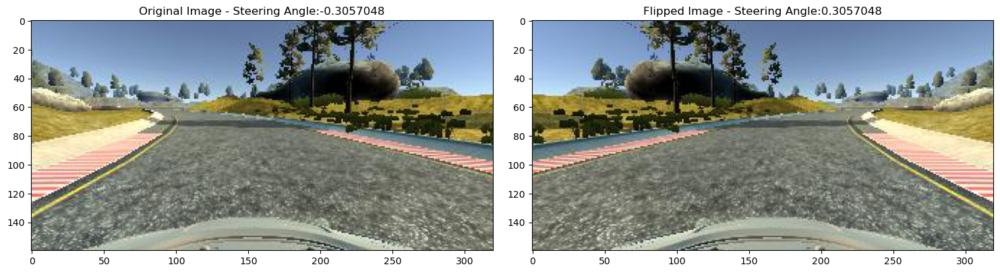

In [21]:
random_index = random.randint(0, 1000)
image = image_paths[random_index]
steering_angle = steerings[random_index]
 
 
original_image = mpimg.imread(image)
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
 
axs[0].imshow(original_image)
axs[0].set_title('Original Image - ' + 'Steering Angle:' + str(steering_angle))
 
axs[1].imshow(flipped_image)
axs[1].set_title('Flipped Image - ' + 'Steering Angle:' + str(flipped_steering_angle))

In [22]:
def random_augment(image, steering_angle):
    image = mpimg.imread(image)
    if np.random.rand() < 0.5:
      image = pan(image)
    if np.random.rand() < 0.5:
      image = zoom(image)
    if np.random.rand() < 0.5:
      image = img_random_brightness(image)
    if np.random.rand() < 0.5:
      image, steering_angle = img_random_flip(image, steering_angle)
    
    return image, steering_angle

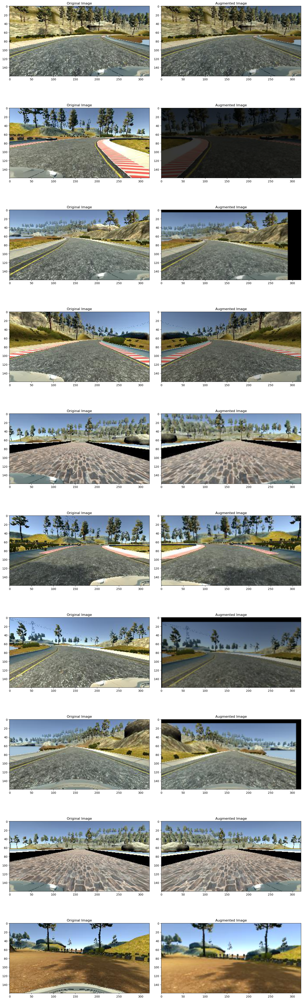

In [23]:
ncol = 2
nrow = 10
 
fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
fig.tight_layout()
 
for i in range(10):
  randnum = random.randint(0, len(image_paths) - 1)
  random_image = image_paths[randnum]
  random_steering = steerings[randnum]
    
  original_image = mpimg.imread(random_image)
  augmented_image, steering = random_augment(random_image, random_steering)
    
  axs[i][0].imshow(original_image)
  axs[i][0].set_title("Original Image")
  
  axs[i][1].imshow(augmented_image)
  axs[i][1].set_title("Augmented Image")

Text(0.5, 1.0, 'Preprocessed Image')

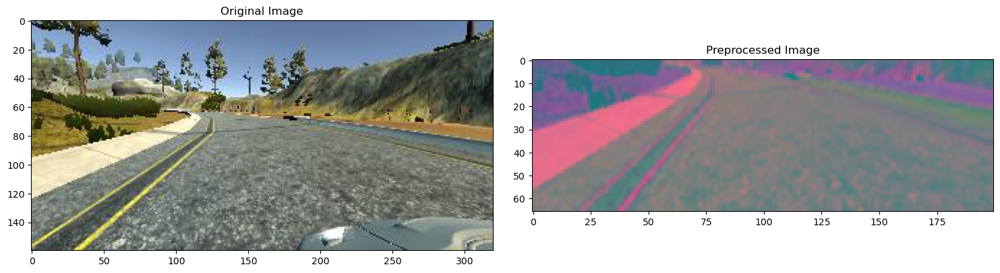

In [26]:
def img_preprocess(img):
    img = img[60:135,:,:]
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    img = cv2.GaussianBlur(img,  (3, 3), 0)
    img = cv2.resize(img, (200, 66))
    img = img/255
    return img
image = image_paths[100]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(original_image)
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessed Image')

In [27]:
def batch_generator(image_paths, steering_ang, batch_size, istraining):
  
  while True:
    batch_img = []
    batch_steering = []
    
    for i in range(batch_size):
    
      random_index = random.randint(0, len(image_paths) - 1)
      
      if istraining:
        im, steering = random_augment(image_paths[random_index], steering_ang[random_index])
        
      else:
        im = mpimg.imread(image_paths[random_index])
        steering = steering_ang[random_index]
      
      im = img_preprocess(im)  
      batch_img.append(im)
      batch_steering.append(steering)
        
    yield (np.asarray(batch_img), np.asarray(batch_steering))

Text(0.5, 1.0, 'Validation Image')

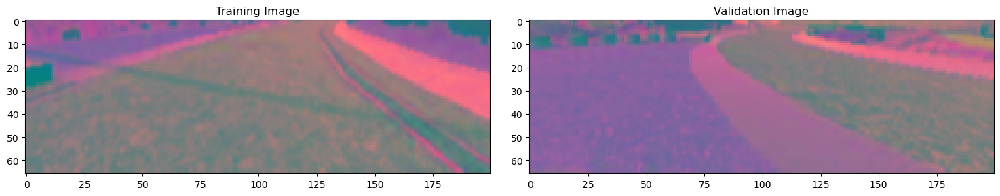

In [28]:
x_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1))
x_valid_gen, y_valid_gen = next(batch_generator(X_valid, y_valid, 1, 0))
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
 
axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training Image')
 
axs[1].imshow(x_valid_gen[0])
axs[1].set_title('Validation Image')

In [29]:
def nvidia_model():
  model = Sequential()
  model.add(Conv2D(24, kernel_size=(5,5), strides=(2, 2), input_shape=(66, 200, 3), activation='elu'))
  model.add(Conv2D(36, kernel_size=(5,5), strides=(2, 2), activation='elu'))
  model.add(Conv2D(48, kernel_size=(5,5), strides=(2, 2), activation='elu'))
  model.add(Conv2D(64, kernel_size=(3,3), activation='elu'))
  
  model.add(Conv2D(64, kernel_size=(3,3), activation='elu'))
#   model.add(Dropout(0.5))
  
  
  model.add(Flatten())
  
  model.add(Dense(100, activation = 'elu'))
#   model.add(Dropout(0.5))
  
  model.add(Dense(50, activation = 'elu'))
#   model.add(Dropout(0.5))
  
  model.add(Dense(10, activation = 'elu'))
#   model.add(Dropout(0.5))
 
  model.add(Dense(1))
  
  optimizer = Adam(1e-3)
  model.compile(loss='mse', optimizer=optimizer)
  return model


In [30]:
model = nvidia_model()
print(model.summary())



Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 31, 98, 24)        1824      
                                                                 
 conv2d_1 (Conv2D)           (None, 14, 47, 36)        21636     
                                                                 
 conv2d_2 (Conv2D)           (None, 5, 22, 48)         43248     
                                                                 
 conv2d_3 (Conv2D)           (None, 3, 20, 64)         27712     
                                                                 
 conv2d_4 (Conv2D)           (None, 1, 18, 64)         36928     
                                                                 
 flatten (Flatten)           (None, 1152)              0         
                                                                 
 dense (Dense)               (None, 100)               1

In [31]:
history = model.fit(batch_generator(X_train, y_train, 100, 1),
                                  steps_per_epoch=300, 
                                  epochs=10,
                                  validation_data=batch_generator(X_valid, y_valid, 100, 0),
                                  validation_steps=200,
                                  verbose=1,
                                  shuffle = 1)

Epoch 1/10
300/300 [==============================] - 101s 336ms/step - loss: 0.1616 - val_loss: 0.0899
Epoch 2/10
300/300 [==============================] - 87s 292ms/step - loss: 0.1005 - val_loss: 0.0785
Epoch 3/10
300/300 [==============================] - 88s 293ms/step - loss: 0.0862 - val_loss: 0.0527
Epoch 4/10
300/300 [==============================] - 98s 329ms/step - loss: 0.0770 - val_loss: 0.0509
Epoch 5/10
300/300 [==============================] - 87s 291ms/step - loss: 0.0686 - val_loss: 0.0483
Epoch 6/10
300/300 [==============================] - 87s 292ms/step - loss: 0.0644 - val_loss: 0.0492
Epoch 7/10
300/300 [==============================] - 87s 291ms/step - loss: 0.0639 - val_loss: 0.0601
Epoch 8/10
300/300 [==============================] - 86s 289ms/step - loss: 0.0598 - val_loss: 0.0345
Epoch 9/10
300/300 [==============================] - 86s 287ms/step - loss: 0.0571 - val_loss: 0.0384
Epoch 10/10
300/300 [==============================] - 86s 288ms/step - 

Text(0.5, 0, 'Epoch')

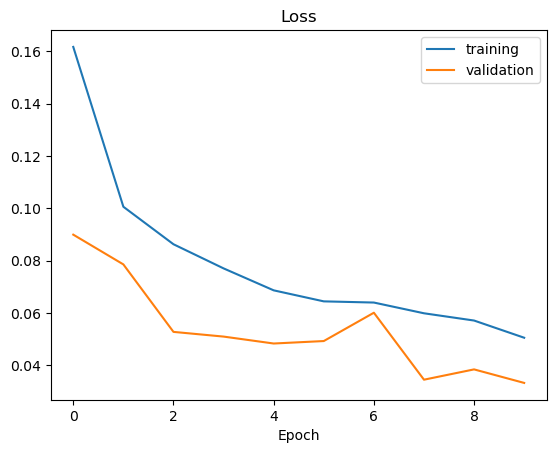

In [32]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training', 'validation'])
plt.title('Loss')
plt.xlabel('Epoch')


In [33]:
model.save('model.h5')


In [38]:
# serialize model to JSON
model_json = model.to_json()
with open("model.json", "w") as json_file:
    json_file.write(model_json)
# serialize weights to HDF5
model.save_weights("model.h5")
print("Saved model to disk")

Saved model to disk
